In [1]:
import re
import os
import sys
import glob
import pathlib
import numpy as np
import xarray as xr
import pandas as pd
import rasterio as rio
from pathlib import Path
from datetime import datetime
import matplotlib.pyplot as plt
from rasterio.plot import plotting_extent
from matplotlib.backends.backend_pdf import PdfPages

plt.style.use("~/geoscience/albedo_downscaling/MNRAS.mplstyle")
%matplotlib inline

In [2]:
cf_file = "/bsuhome/tnde/scratch/felix/Sentinel-2/s2_albedo_outputs/tsi_cloud_fractions.csv"
cf_vals = pd.read_csv(cf_file)
print(len(cf_vals))
cf_vals = cf_vals[cf_vals["cf_interp"]<=0.40]
cf_vals = cf_vals.drop_duplicates(subset=["date"])
display(cf_vals.head())
len(cf_vals)

184


,date,cf_interp,cf_planar
1,2021-09-08,0.374858,0.342255
3,2021-09-18,0.068292,0.078906
4,2021-09-23,0.079633,0.081623
11,2021-10-28,0.298115,0.177502
13,2021-11-07,0.075779,0.053905


59

In [3]:
albedo_path = "/bsuhome/tnde/scratch/felix/Sentinel-2/s2_albedo_outputs/*_S2_BLUE20m_SW_hard.tif"
albedo_files = os.path.abspath(albedo_path)
albedo_files_sorted = sorted(glob.glob(albedo_files))
unet_files_list = []
# invalid_dates = ["2021-09-23", "2022-03-12", "2022-03-12", 
#                  "2022-04-06", "2022-05-06", "2022-05-26", 
#                  "2022-09-18", "2022-10-13", "2022-10-18"]

# invalid_dates = ["2022-07-10", "2022-05-06", "2022-04-21", 
#                  "2022-04-06", "2022-04-01", "2022-03-12", 
#                  "2021-09-23"]

invalid_dates = ["2022-09-23", "2021-10-28", "2022-03-12", "2022-04-01", 
                 "2022-04-06", "2022-04-21", "2022-04-26", "2022-05-06", 
                 "2022-05-26", "2022-05-31", "2022-07-10"]

for s2_date in list(cf_vals["date"]):
    unet_file = f"/bsuhome/tnde/scratch/felix/Sentinel-2/s2_albedo_outputs/{s2_date}_S2_BLUE20m_SW_hard.tif"
    if s2_date in invalid_dates:
        pass
    elif unet_file not in albedo_files_sorted:
        print(f"File: {unet_file} not found in list.")
    else:
        unet_files_list.append(unet_file)
print(f"Number of U-Net files: {len(unet_files_list)}")

Number of U-Net files: 48


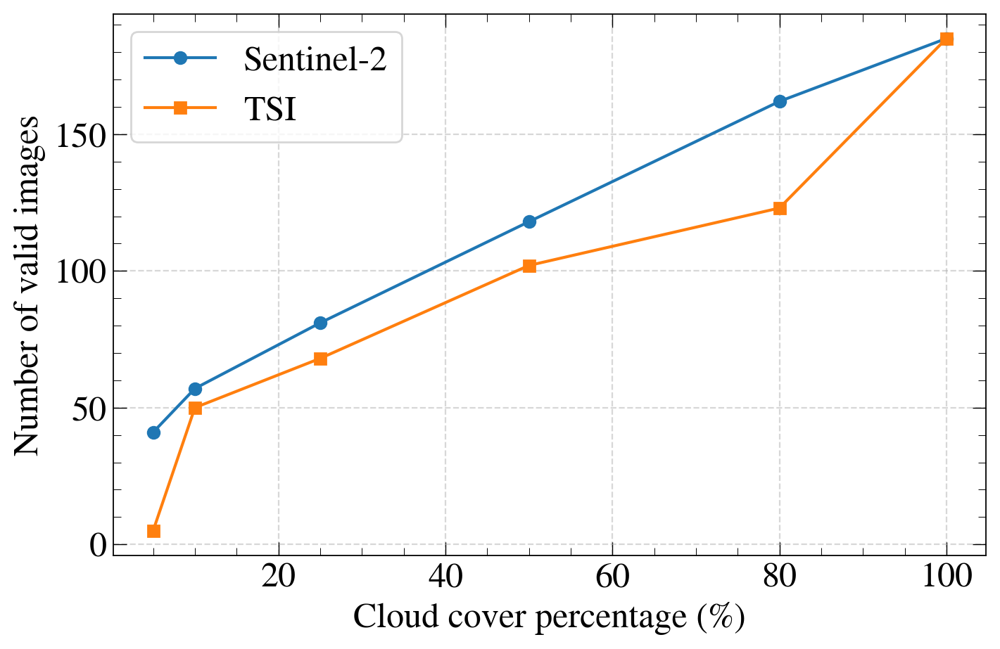

In [4]:
# before dropping duplicates
data = {
    "Percentage": [5, 10, 25, 50, 80, 100],
    "Sentinel-2": [41, 57, 81, 118, 162, 185],
    "TSI":        [5, 50, 68, 102, 123, 185],
}

# # after dropping duplicates
# data = {
#     "Percentage": [5, 10, 25, 50, 80, 100],
#     "Sentinel-2": [29, 39, 56, 81, 111, 128],
#     "TSI":        [4, 36, 48, 71, 85, 128],
# }


df = pd.DataFrame(data)

# # Save to CSV 
# csv_path = "/bsuhome/tnde/scratch/felix/Sentinel-2/s2_albedo_outputs/ccf_vs_no_of_images_without_duplicates.csv"
# df.to_csv(csv_path, index=False)

# Plot
plt.figure(figsize=(8, 5))
plt.plot(df["Percentage"], df["Sentinel-2"], marker="o", label="Sentinel-2")
plt.plot(df["Percentage"], df["TSI"], marker="s", label="TSI")
plt.xlabel("Cloud cover percentage (%)")
plt.ylabel("Number of valid images")
# plt.title("Cloud cover percentage vs number of valid images")
plt.grid(True, linestyle="--", alpha=0.5)
plt.legend()
png_path = "/bsuhome/tnde/scratch/felix/Sentinel-2/s2_albedo_outputs/ccf_vs_no_of_images.png"
plt.savefig(png_path, dpi=150, bbox_inches="tight")
plt.show()


## Rename GOES-MODIS downscaled files.

Uncomment the cell below and run it when necessary. 

Set `DRY_RUN` to `False` only when necessary.

In [5]:
# # --- Config ---
# # Run only once
# training = True
# if training:
#     DIR = Path("/bsuhome/tnde/scratch/felix/UNet/Unet_train_preds_modis_new")
# else:
#     DIR = Path("/bsuhome/tnde/scratch/felix/UNet/Unet_test_preds_modis_new")

# DRY_RUN = True  # set to False to actually rename. Only set to False when necessary.

# # Regex to find a 7-digit Year+DOY token (e.g., 2021244)
# token_re = re.compile(r"(?P<year>\d{4})(?P<doy>\d{3})")

# def yjjj_to_ymd_hyphen(year_str: str, doy_str: str) -> str:
#     """Convert 'YYYY' + 'JJJ' (day-of-year) to 'YYYY-MM-DD'."""
#     dt = datetime.strptime(year_str + doy_str, "%Y%j")
#     return dt.strftime("%Y-%m-%d")  # << hyphenated format

# renamed = 0
# for tif in DIR.glob("*.tif"):
#     m = token_re.search(tif.name)
#     if not m:
#         continue

#     year, doy = m.group("year"), m.group("doy")
#     try:
#         ymd_hyphen = yjjj_to_ymd_hyphen(year, doy)
#     except ValueError:
#         # Invalid DOY (e.g., 367) — skip safely
#         continue

#     new_name = token_re.sub(ymd_hyphen, tif.name, count=1)  # replace first occurrence only
#     new_path = tif.with_name(new_name)

#     print(f"{tif.name}  ->  {new_name}")
#     if not DRY_RUN:
#         tif.rename(new_path)
#         renamed += 1

# if not DRY_RUN:
#     print(f"Renamed {renamed} files.")
# else:
#     print("DRY RUN: no files were renamed. Set DRY_RUN=False to apply changes.")


## Matching Sentinel-2 and MODIS files.

### Matching train files

In [6]:
modis_train_path = "/bsuhome/tnde/scratch/felix/UNet/Unet_train_preds_modis_new/predicted_*"
modis_train_files = os.path.abspath(modis_train_path)
modis_train_files_sorted = sorted(glob.glob(modis_train_files))
modis_unet_train_files_list = []

s2_train_path = "/bsuhome/tnde/scratch/felix/Sentinel-2/s2_albedo_outputs/*_S2_BLUE20m_SW_hard.tif"
s2_train_files = os.path.abspath(s2_train_path)
s2_train_files_sorted = sorted(glob.glob(s2_train_files))
s2_unet_train_files_list = []
# invalid_train_dates = ["2021-09-23", "2022-03-12", "2022-03-12", 
#                        "2022-04-06", "2022-05-06", "2022-05-26", 
#                        "2022-09-18", "2022-10-13", "2022-10-18"]

# invalid_train_dates = ["2022-07-10", "2022-05-06", "2022-04-21", 
#                        "2022-04-06", "2022-04-01", "2022-03-12", 
#                        "2021-09-23"]

invalid_train_dates = ["2022-09-23", "2021-10-28", "2022-03-12", "2022-04-01", 
                       "2022-04-06", "2022-04-21", "2022-04-26", "2022-05-06", 
                       "2022-05-26", "2022-05-31", "2022-07-10"]

for s2_date in list(cf_vals["date"]):
    modis_unet_train_file = f"/bsuhome/tnde/scratch/felix/UNet/Unet_train_preds_modis_new/predicted_{s2_date}_modis_blue_sky_albedo_.tif"
    s2_unet_train_file = f"/bsuhome/tnde/scratch/felix/Sentinel-2/s2_albedo_outputs/{s2_date}_S2_BLUE20m_SW_hard.tif"
    if s2_date in invalid_train_dates:
        pass
    elif modis_unet_train_file not in modis_train_files_sorted:
        # print(f"File: {modis_unet_train_file} not matched.")
        pass
    else:
        modis_unet_train_files_list.append(modis_unet_train_file)
        s2_unet_train_files_list.append(s2_unet_train_file)
print(f"Number of MODIS U-Net train files: {len(modis_unet_train_files_list)}")
print(f"Number of Sentinel-2 U-Net train files: {len(s2_unet_train_files_list)}")

Number of MODIS U-Net train files: 23
Number of Sentinel-2 U-Net train files: 23


In [7]:
all_modis_train = modis_unet_train_files_list
all_s2_train    = s2_unet_train_files_list

n_total   = len(all_modis_train)
test_size = max(1, int(0.3 * n_total))   # avoid 0 for tiny datasets
modis_test = all_modis_train[-test_size:]
s2_test    = all_s2_train[-test_size:]
modis_train = all_modis_train[:-test_size]
s2_train    = all_s2_train[:-test_size]
len(s2_train), len(s2_test), len(modis_train), len(modis_test)
# int(0.85*17)

(17, 6, 17, 6)

### Matching test files

In [8]:
modis_test_path = "/bsuhome/tnde/scratch/felix/UNet/Unet_test_preds_modis_new/predicted_*"
modis_test_files = os.path.abspath(modis_test_path)
modis_test_files_sorted = sorted(glob.glob(modis_test_files))
modis_unet_test_files_list = []
# invalid_test_dates = ["2021-09-23", "2022-03-12", "2022-03-12", 
#                       "2022-04-06", "2022-05-06", "2022-05-26", 
#                       "2022-09-18", "2022-10-13", "2022-10-18"]

# invalid_test_dates = ["2022-07-10", "2022-05-06", "2022-04-21", 
#                       "2022-04-06", "2022-04-01", "2022-03-12", 
#                       "2021-09-23"]

invalid_test_dates = ["2022-09-23", "2021-10-28", "2022-03-12", "2022-04-01", 
                      "2022-04-06", "2022-04-21", "2022-04-26", "2022-05-06", 
                      "2022-05-26", "2022-05-31", "2022-07-10"]

s2_test_path = "/bsuhome/tnde/scratch/felix/Sentinel-2/s2_albedo_outputs/*_S2_BLUE20m_SW_hard.tif"
s2_test_files = os.path.abspath(s2_test_path)
s2_test_files_sorted = sorted(glob.glob(s2_test_files))
s2_unet_test_files_list = []

for s2_date in list(cf_vals["date"]):
    modis_unet_test_file = f"/bsuhome/tnde/scratch/felix/UNet/Unet_test_preds_modis_new/predicted_{s2_date}_modis_blue_sky_albedo_.tif"
    s2_unet_test_file = f"/bsuhome/tnde/scratch/felix/Sentinel-2/s2_albedo_outputs/{s2_date}_S2_BLUE20m_SW_hard.tif"
    if s2_date in invalid_test_dates:
        pass
    if modis_unet_test_file not in modis_test_files_sorted:
        # print(f"File: {modis_unet_test_file} not matched.")
        pass
    else:
        modis_unet_test_files_list.append(modis_unet_test_file)
        s2_unet_test_files_list.append(s2_unet_test_file)
print(f"Number of MODIS U-Net test files: {len(modis_unet_test_files_list)}")
print(f"Number of Sentinel-2 U-Net test files: {len(s2_unet_test_files_list)}")

Number of MODIS U-Net test files: 6
Number of Sentinel-2 U-Net test files: 6


## Rub U-Net

In [9]:
train_model = False
if train_model:
    history = %run modis_s2_unet2.py
else:
    # Clip path to all helper functions
    function_path = os.path.expanduser("~/geoscience/albedo_downscaling/functions")
    sys.path.append(function_path)
    # import all the helper functions.
    from modis_s2_unet2 import *

2025-12-10 16:22:33.561135: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-12-10 16:22:33.604707: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX512F AVX512_VNNI, in other operations, rebuild TensorFlow with the appropriate compiler flags.


Number of MODIS U-Net train files: 23
Number of Sentinel-2 U-Net train files: 23
Number of MODIS U-Net test files: 6
Number of Sentinel-2 U-Net test files: 6


In [10]:
TF_HISTORY_PATH = "/bsuhome/tnde/scratch/felix/UNet2/Results_new/training/history_new_old.json"

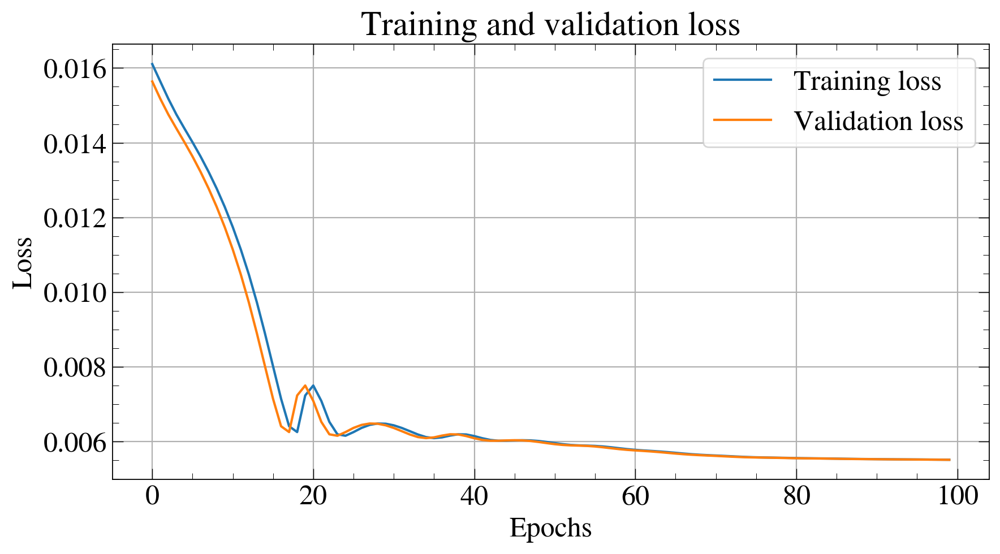

In [12]:
with open(TF_HISTORY_PATH, 'r') as file:
    history_dict = json.load(file)
    
training_loss = history_dict['loss']
validation_loss = history_dict['val_loss']

plt.figure(figsize=(10, 5))
plt.plot(training_loss, label='Training loss')
plt.plot(validation_loss, label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

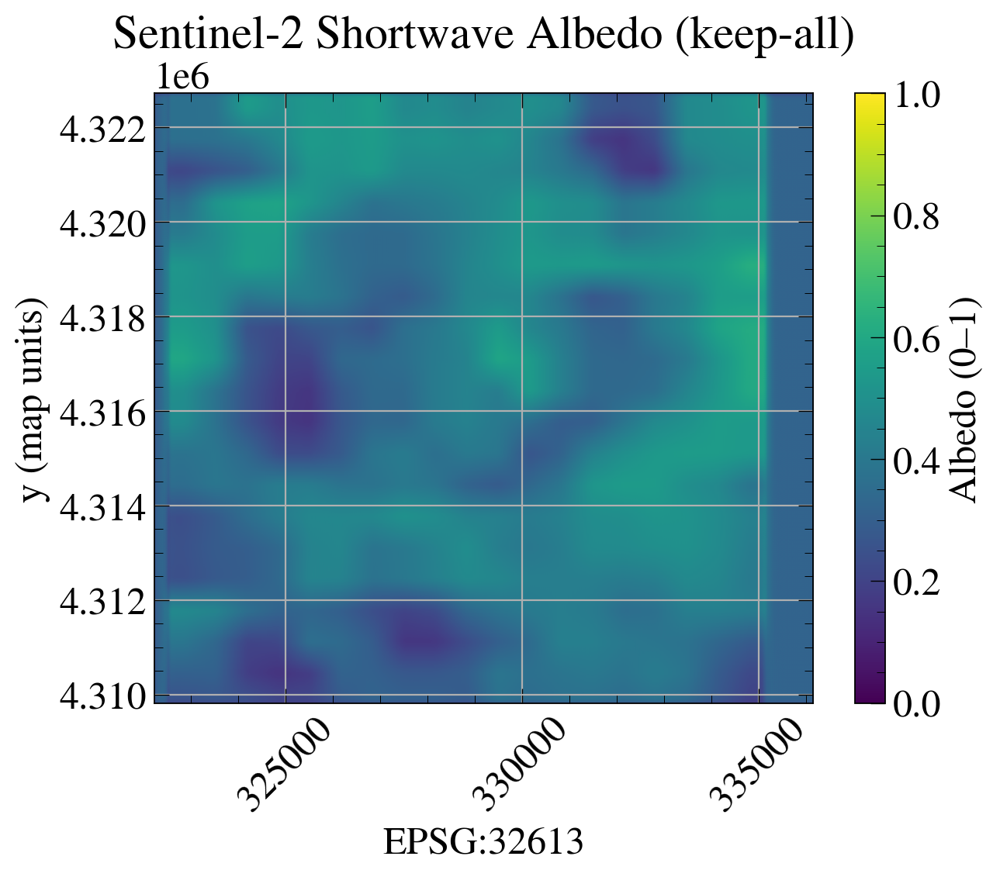

In [11]:
tif = "/bsuhome/tnde/scratch/felix/UNet2/Unet_test_preds_s2_new/predicted_s2_2022-11-02_S2_BLUE20m_SW_hard.tif"

with rio.open(tif) as ds:
    arr = ds.read(1, masked=True)  # nodata -> mask
    extent = plotting_extent(ds)

plt.figure(figsize=(8,6))
im = plt.imshow(arr, vmin=0, vmax=1, extent=extent, origin="upper")
plt.tick_params(axis='x', rotation=45)
plt.title("Sentinel-2 Shortwave Albedo (keep-all)")
plt.xlabel(ds.crs.to_string()); plt.ylabel("y (map units)")
cbar = plt.colorbar(im, fraction=0.046, pad=0.04)
cbar.set_label("Albedo (0–1)")
plt.tight_layout(); plt.show()

In [12]:
# tif1 = "/bsuhome/tnde/scratch/felix/UNet2/Unet_test_preds_s2_new/predicted_s2_2022-02-20_S2_BLUE20m_SW_hard.tif"
# tif2 = "/bsuhome/tnde/scratch/felix/Sentinel-2/s2_albedo_outputs/2022-02-20_S2_BLUE20m_SW_hard.tif"#s2_unet_test_files_list[0]

# fig, axs = plt.subplots(1, 2, figsize=(12,5), constrained_layout=True)
# for ax, path in zip(axs, [tif1, tif2]):
#     with rio.open(path) as ds:
#         arr = ds.read(1, masked=True)
#         extent = plotting_extent(ds)
#     im = ax.imshow(arr, vmin=0, vmax=1, extent=extent, origin="upper")
#     ax.tick_params(axis='x', rotation=0)
#     # ax.set_title(f"{date} • SW albedo • {title}")
#     ax.set_xlabel(ds.crs.to_string()); ax.set_ylabel("")

# fig.suptitle("Sentinel-2 Shortwave Albedo (keep-all)")
# fig.colorbar(im, ax=axs, location="right", fraction=0.046, pad=0.04, label="Albedo (0–1)")
# plt.show()

Found 6 matching dates


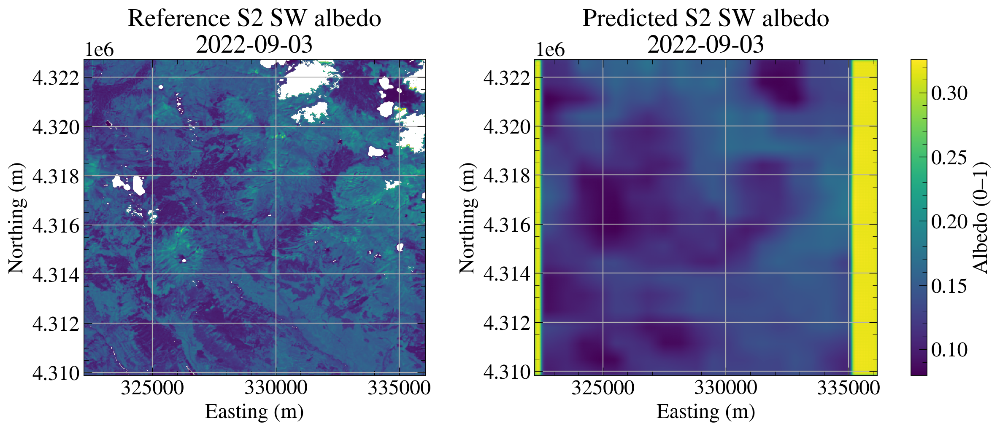

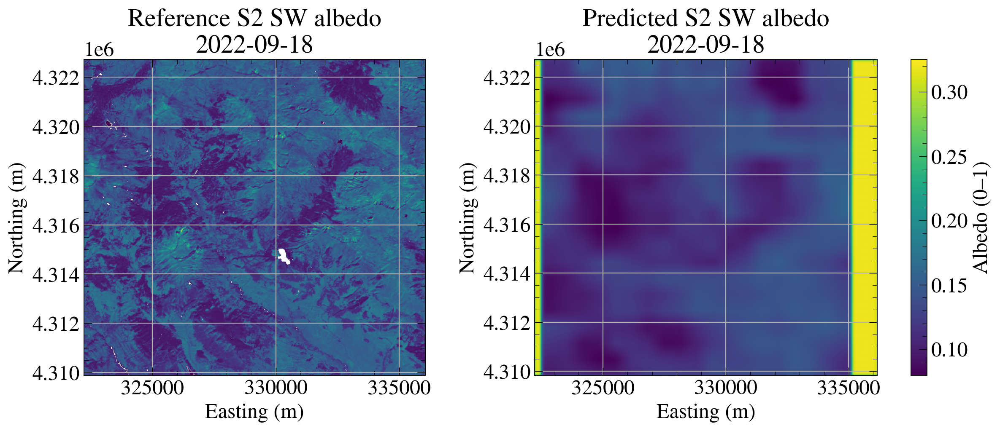

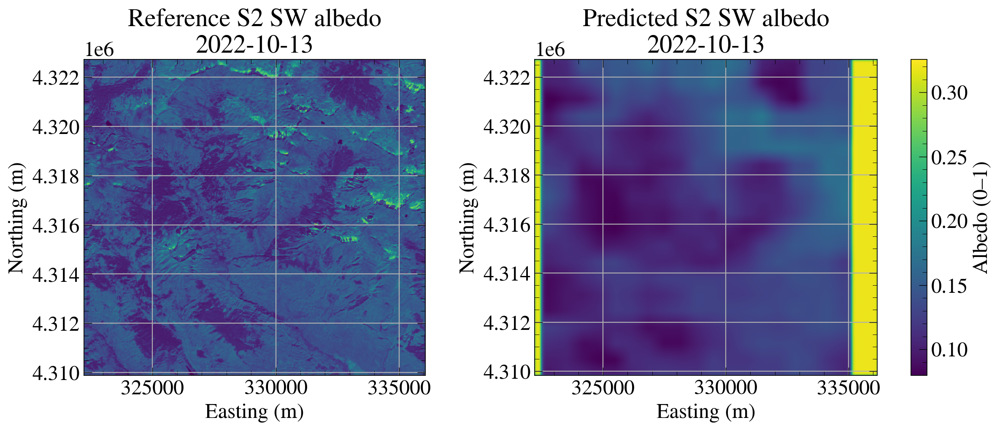

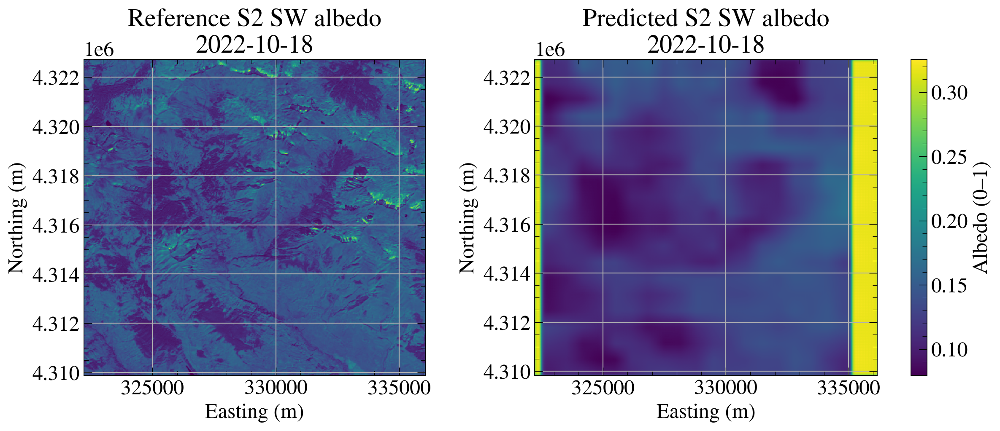

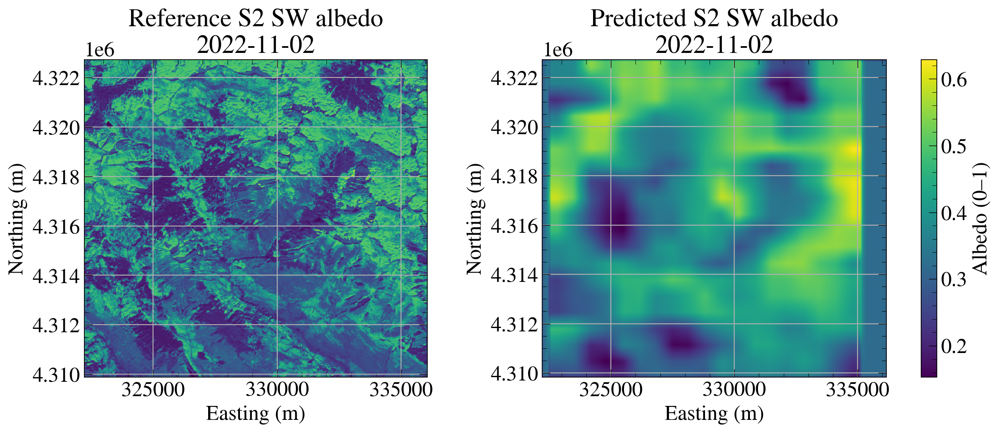

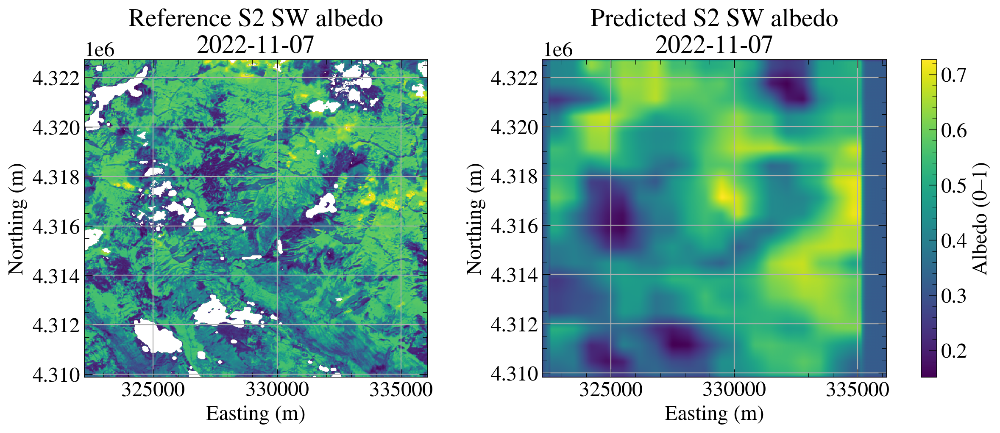

In [14]:
# --- Directories with TIFs ---
dir_pred = Path("/bsuhome/tnde/scratch/felix/UNet2/Unet_test_preds_s2_new")
dir_ref  = Path("/bsuhome/tnde/scratch/felix/Sentinel-2/s2_albedo_outputs")

# --- Helper to extract YYYY-MM-DD from filename ---
date_re = re.compile(r"\d{4}-\d{2}-\d{2}")

def extract_date(path: Path):
    m = date_re.search(path.name)
    return m.group(0) if m else None

# --- Index files in each directory by date ---
pred_index = {}
for p in sorted(dir_pred.glob("*.tif")):
    d = extract_date(p)
    if d is not None:
        pred_index.setdefault(d, []).append(p)

ref_index = {}
for p in sorted(dir_ref.glob("*.tif")):
    d = extract_date(p)
    if d is not None:
        ref_index.setdefault(d, []).append(p)

# --- Find common dates ---
common_dates = sorted(set(pred_index.keys()) & set(ref_index.keys()))
print(f"Found {len(common_dates)} matching dates")

# --- Loop over matching dates and plot pairs ---
for d in common_dates:
    # if multiple files per date, just take the first of each
    pred_path = pred_index[d][0]
    ref_path  = ref_index[d][0]

    fig, axs = plt.subplots(1, 2, figsize=(12, 5), constrained_layout=True)

    for ax, path, title in zip(
        axs,
        [ref_path, pred_path],
        ["Reference S2 SW albedo", "Predicted S2 SW albedo"],
    ):
        with rio.open(path) as ds:
            arr = ds.read(1, masked=True)
            extent = plotting_extent(ds)

        im = ax.imshow(
            arr,
            extent=extent,
            origin="upper"
        )
        ax.set_title(f"{title}\n{d}")
        # ax.set_xlabel(ds.crs.to_string())
        ax.set_xlabel("Easting (m)")
        ax.set_ylabel("Northing (m)")

    # fig.suptitle(f"Sentinel-2 Shortwave Albedo (keep-all) — {d}")
    fig.colorbar(im, ax=axs, location="right",
                 fraction=0.046, pad=0.04, label="Albedo (0–1)")
    plt.show()


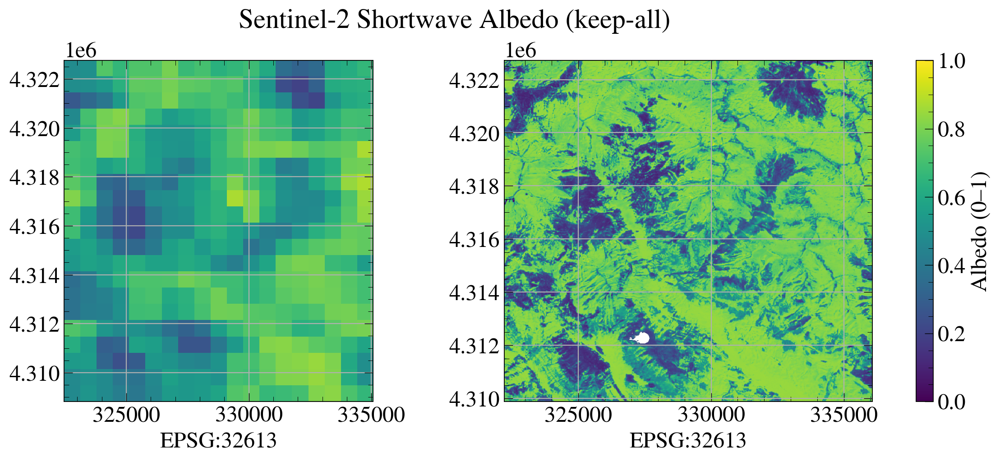

In [21]:
tif1 = "/bsuhome/tnde/scratch/felix/UNet/Unet_train_preds_modis_new/predicted_2022-03-02_modis_blue_sky_albedo_.tif"
tif2 = "/bsuhome/tnde/scratch/felix/Sentinel-2/s2_albedo_outputs/2022-03-02_S2_BLUE20m_SW_hard.tif"#s2_unet_test_files_list[0]

fig, axs = plt.subplots(1, 2, figsize=(12,5), constrained_layout=True)
for ax, path in zip(axs, [tif1, tif2]):
    with rio.open(path) as ds:
        arr = ds.read(1, masked=True)
        extent = plotting_extent(ds)
    im = ax.imshow(arr, vmin=0, vmax=1, extent=extent, origin="upper")
    ax.tick_params(axis='x', rotation=0)
    # ax.set_title(f"{date} • SW albedo • {title}")
    ax.set_xlabel(ds.crs.to_string()); ax.set_ylabel("")

fig.suptitle("Sentinel-2 Shortwave Albedo (keep-all)")
fig.colorbar(im, ax=axs, location="right", fraction=0.046, pad=0.04, label="Albedo (0–1)")
plt.show()